In [1]:
import sys
sys.path.append('../datasets')

import torch

import matplotlib.pyplot as plt

from datasets import HSIDataset

from torchvision import transforms
from math import sqrt

In [2]:
# Define device (default is "cpu")
device = "cpu" 

# Define dtype
dtype = torch.float64

# Define random seed
seed = 42
torch.manual_seed(seed)

# Define data path
data_path = '/home/y/Documents/Data/HSI/datasets/harvard.zarr'


In [3]:
val_transform = transforms.Compose([transforms.ToTensor()]) # Transforms a the input data to torch tensors
dataset = HSIDataset(root_dir=data_path, split='train', transform=val_transform)

In [15]:
from PIL import Image

path = '/home/y/Documents/Data/HSI/CZ_hsdb/rgb'
for i, hsi in enumerate(dataset):
    rgb = hsi[dataset.rgb_index, ...].numpy().swapaxes(0, 2).swapaxes(0, 1)
    rgb = rgb / rgb.max()

    im = Image.fromarray((rgb * 255).astype('uint8'))
    im.save(f'{path}/rgb_{i}.png')
    print(f'Saved image {i}')

Saved image 0
Saved image 1
Saved image 2
Saved image 3
Saved image 4
Saved image 5
Saved image 6
Saved image 7
Saved image 8
Saved image 9
Saved image 10
Saved image 11
Saved image 12
Saved image 13
Saved image 14
Saved image 15
Saved image 16
Saved image 17
Saved image 18
Saved image 19
Saved image 20
Saved image 21
Saved image 22
Saved image 23
Saved image 24
Saved image 25
Saved image 26
Saved image 27
Saved image 28
Saved image 29
Saved image 30
Saved image 31
Saved image 32
Saved image 33
Saved image 34
Saved image 35
Saved image 36
Saved image 37
Saved image 38
Saved image 39
Saved image 40
Saved image 41
Saved image 42
Saved image 43
Saved image 44
Saved image 45
Saved image 46
Saved image 47
Saved image 48
Saved image 49


In [10]:

# Choose the index of the selected image in the dataset (ENMAP dataset contains 11 000 images)
idx = 4
x = dataset[idx].unsqueeze(0).to(device=device, dtype=dtype) # import image to device (cpu or gpu), sizes of x is [1,number of bands, width, height]
# Adds a small amount of white gaussian noise to the input HSI (sigma2 = 1e-4)
x += torch.rand_like(x, device=device, dtype=dtype)*1e-2/torch.norm(x)

# Compute the panchromatic image from the ground truth HSI
panc = torch.sum(x, dim=1).unsqueeze(1)/x.shape[1]

# Adds noise to the input HSI
SNR = 10

sigma2 = 10**(-SNR/10) * torch.norm(x, dim=[2,3])**2 / x.shape[2] / x.shape[3]
sigma2 = sigma2.unsqueeze(0).unsqueeze(1).reshape(1, sigma2.numel(), 1, 1)
sigma2 = sigma2.repeat(1, 1, x.shape[2], x.shape[3])

y = x + torch.sqrt(sigma2)*torch.randn_like(x, device=device, dtype=dtype)



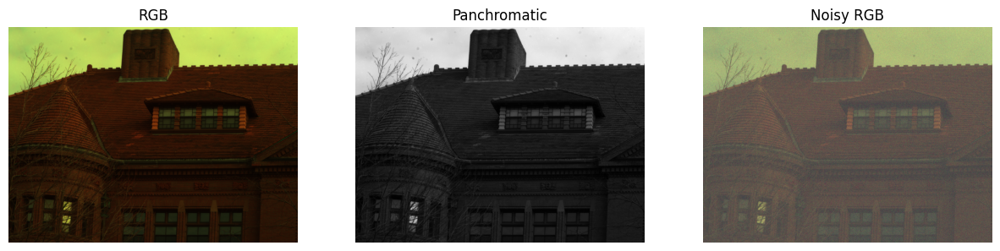

In [11]:
# Plot RGB and panchromatic 

rgb = dataset.rgb_index
x_rgb = x[0, rgb,...].cpu().numpy().transpose(1, 2, 0)
x_rgb = (x_rgb - x_rgb.min())/(x_rgb.max() - x_rgb.min())

y_rgb = y[0, rgb, ...].cpu().numpy().transpose(1, 2, 0)
y_rgb = (y_rgb - y_rgb.min())/(y_rgb.max() - y_rgb.min())



plt.figure(figsize=(15, 5))
plt.subplot(131)
plt.imshow(x_rgb)
plt.title('RGB')
plt.axis('off')

plt.subplot(132)
plt.imshow(panc[0, 0, ...].cpu().numpy(), cmap='gray')
plt.title('Panchromatic')
plt.axis('off')

plt.subplot(133)
plt.imshow(y_rgb)
plt.title('Noisy RGB')
plt.axis('off')

plt.show()

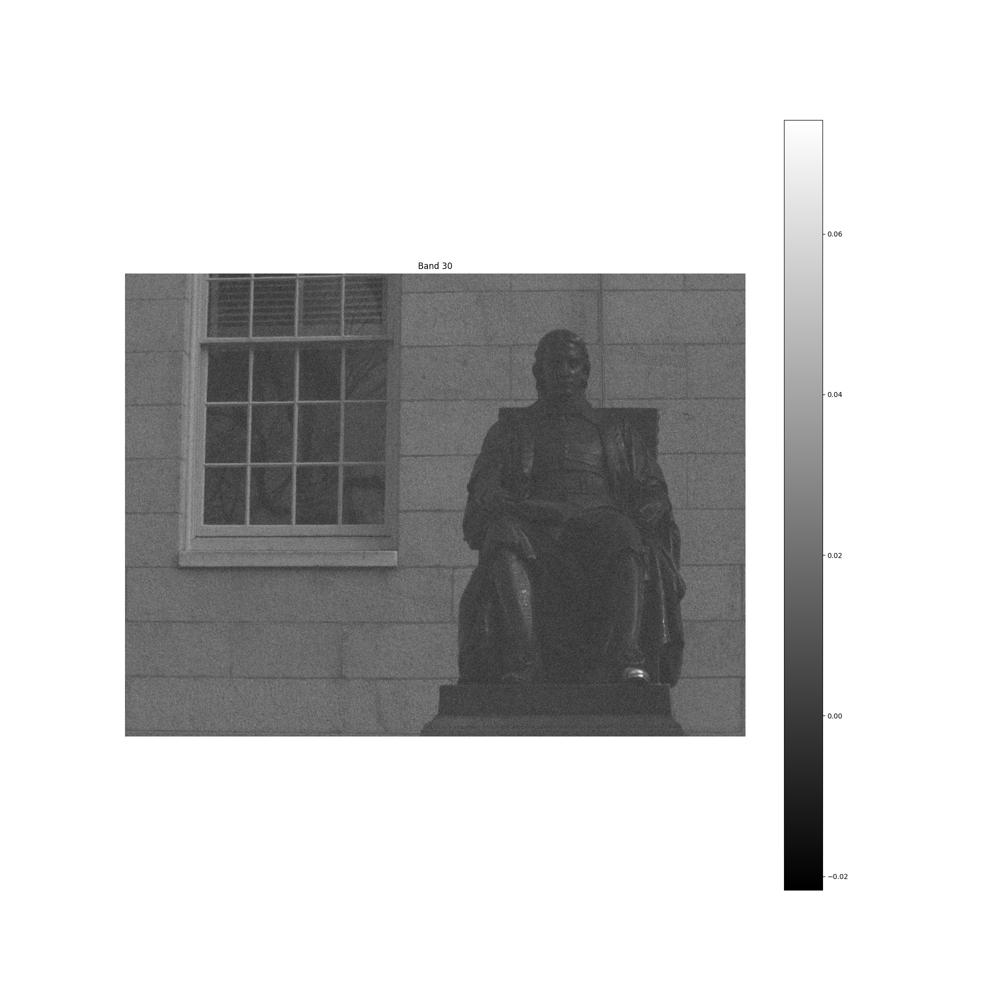

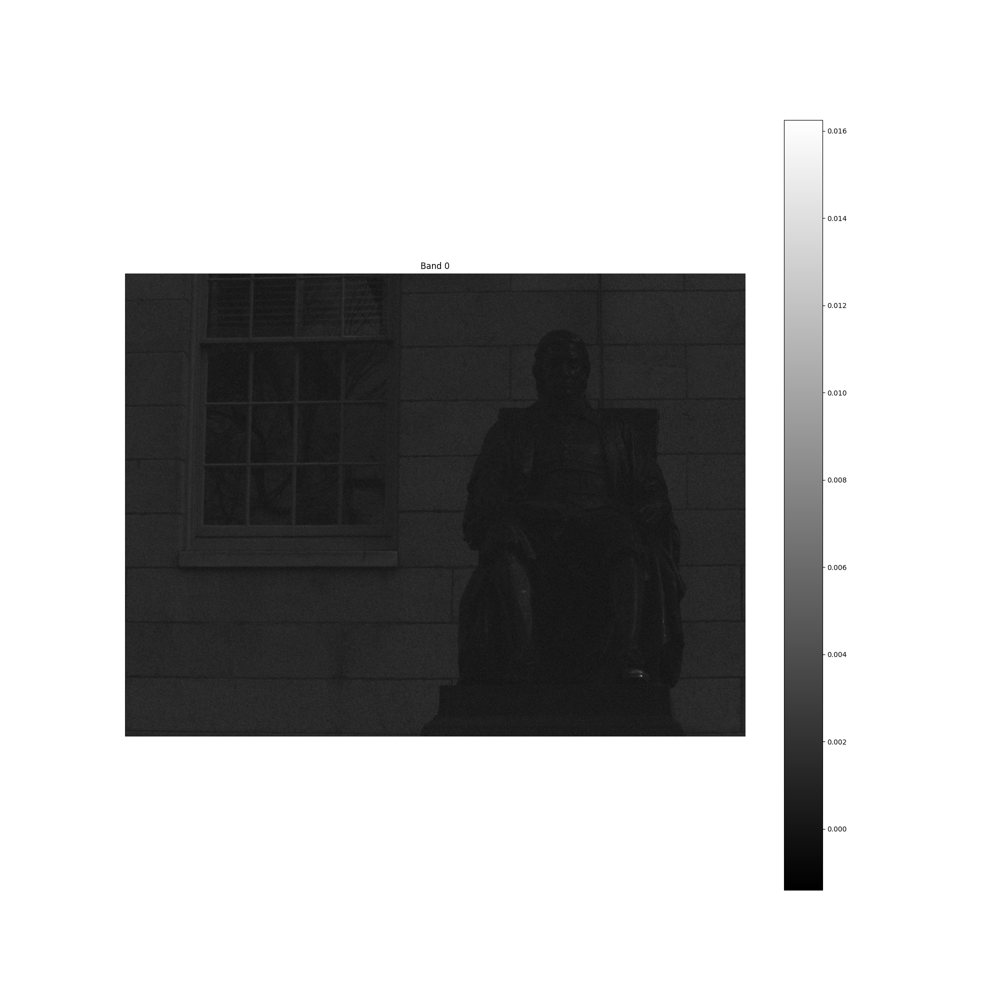

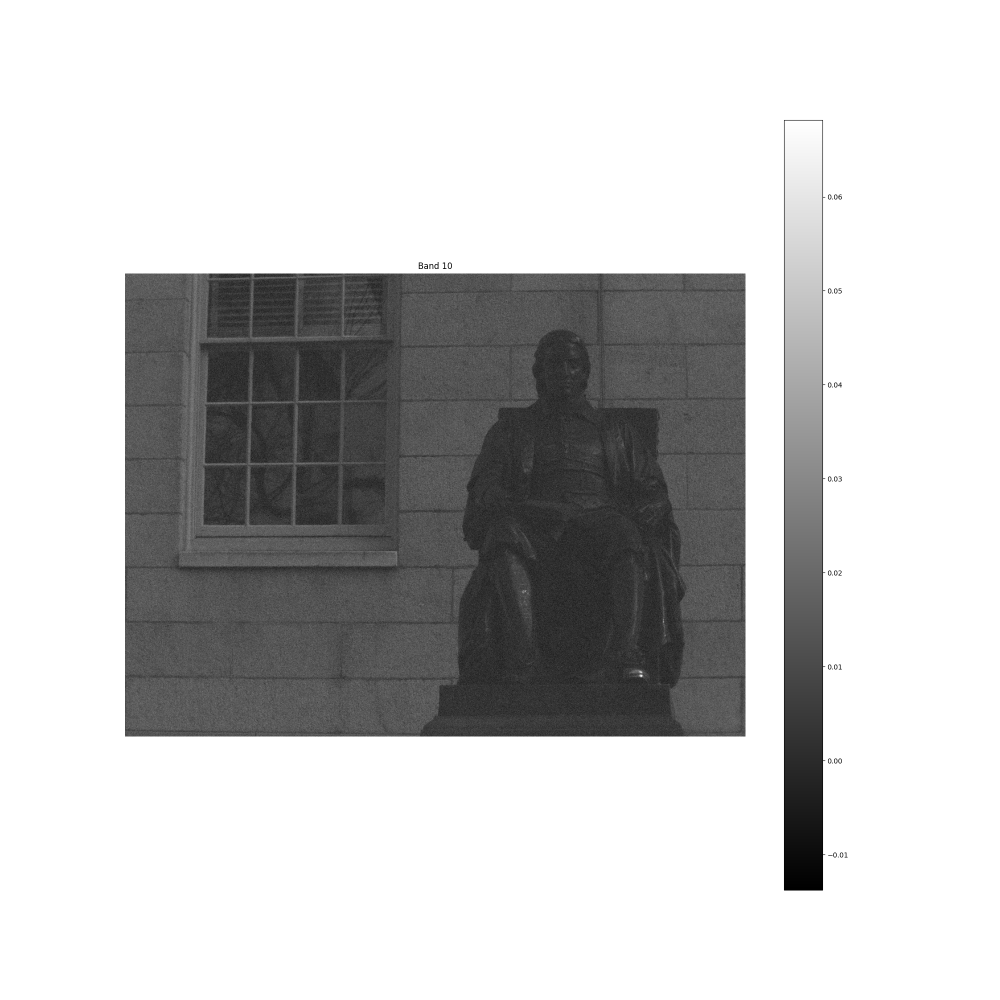

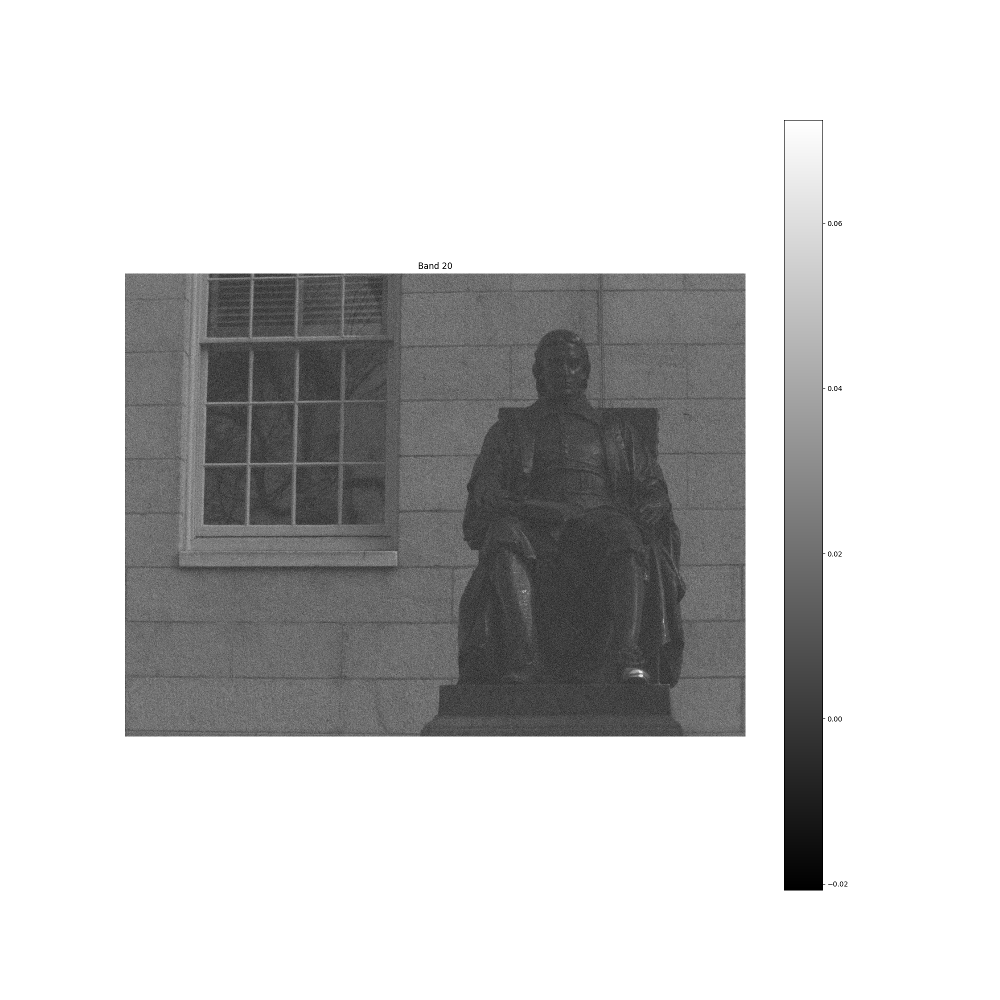

In [38]:
# Plot bands of the HSI
%matplotlib ipympl
band_idx = [0,10,20,30]

for i, idx in enumerate(band_idx):
    plt.figure(figsize=(20, 20))
    # plt.subplot(1, len(band_idx), i+1)
    plt.imshow(y[0, idx, ...].cpu().numpy(), cmap='gray')
    plt.colorbar()
    plt.title(f'Band {idx}')
    plt.axis('off')
    
plt.show()
# ['tk', 'gtk', 'gtk3', 'gtk4', 'wx', 'qt4', 'qt5', 'qt6', 'qt', 'osx', 'nbagg', 'webagg', 'notebook', 'agg', 'svg', 'pdf', 'ps', 'inline', 'ipympl', 'widget']